# **APS 1 - IA para Automação**
## **Classificador de Falhas em Acionamento de Máquinas Rotativas**
### _Trabalho feito por Bruno Olivares, Gustavo e Lucas Gomes_

#### **1. Panorama do Projeto**

##### Problema a ser resolvido

O projeto tem como objetivo o desenvolvimento de um sistema de aprendizado de máquina, para a classificação da condição operacional de uma máquina rotativa acionada por motor elétrico. A classificação deve ser realizada a partir de atributos obtidos de grandezas elétricas e sinais de vibração, como corrente de entrada e saída, potência, desvio-padrão, amplitude, curtose e magnitudes de frequência dos sensores de vibração.

As possíveis classes de saída são:
- Normal;
- Desacoplado;
- Sobrecarga;
- Desbalanceado;
- Desalinhado.

Os atributos  e condições operacionais analisados podem ser vistos na tabela abaixo:

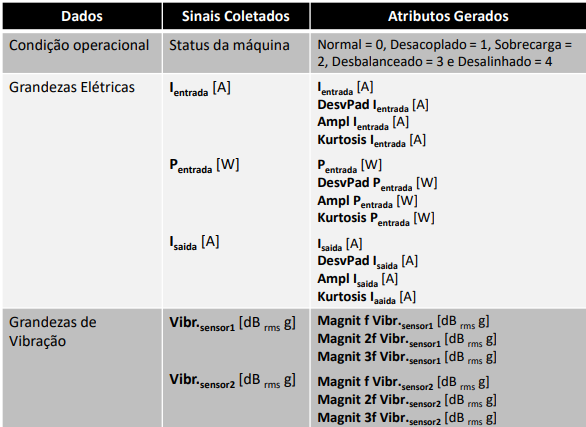

Portanto, trata-se de um problema de classificação supervisionada multiclasse. O modelo recebe os atributos medidos como entrada e deve indicar uma das cinco condições operacionais como saída.



##### Escolha da métrica de desempenho

Antes de desenvolver o modelo de classificação, é importante entender as métricas de avaliação adequadas para o projeto.

Acurácia mede a taxa de acerto total, através da equação:

$$
\text{Acurácia} = \frac{\text{número de classificações corretas}}{\text{total de amostras}}
$$

Ela é útil para ter uma visão geral do modelo. Porém, não deve ser a métrica principal neste projeto. Se houver muito mais registros da condição Normal do que das falhas, o modelo pode alcançar alta acurácia ao prever “Normal” com frequência, mas ainda deixar de identificar falhas importantes. 

Precisão mede, entre os casos previstos como uma classe, quantos realmente pertencem a ela:

$$
\text{Precisão} = \frac{VP}{VP + FP}
$$

onde VP são verdadeiros positivos e FP são falsos positivos. No projeto, alta precisão para “Desbalanceado”, por exemplo, significa que, quando o modelo aponta desbalanceamento, geralmente está correto. É útil para reduzir falsos alarmes e inspeções desnecessárias, mas sozinha não mostra quantas falhas reais foram deixadas de detectar.

Recall mede, entre todos os casos que realmente pertencem a uma classe, quantos foram identificados:

$$
\text{Recall} = \frac{VP}{VP + FN}
$$

onde FN são falsos negativos. Situações de recall alto indica que o sistema está detectando a maior parte das falhas reais. Recall baixo seria perigoso, pois uma máquina com sobrecarga ou desalinhamento poderia ser classificada como normal. Contudo, usado isoladamente, pode levar o modelo a emitir muitos alarmes incorretos.

F1-score combina precisão e recall por meio da média harmônica:

$$
F1 = 2 \times \frac{\text{Precisão} \times \text{Recall}}{\text{Precisão} + \text{Recall}}
$$

O F1-score é uma métrica que combina precisão e recall em um único valor. A precisão mede a confiabilidade de uma previsão: entre as amostras classificadas como uma determinada falha, quantas realmente pertencem àquela classe. O recall mede a capacidade de detecção: entre todas as amostras que realmente apresentam uma falha, quantas foram corretamente identificadas pelo modelo.

O uso do F1-score é adequado porque, em um sistema de diagnóstico de falhas, não é suficiente apenas classificar muitos casos corretamente no total. É necessário evitar tanto falsos alarmes quanto falhas não detectadas. O F1-score penaliza os dois tipos de erro, pois só atinge valor elevado quando precisão e recall também são elevados.

#### **2. Exploração e Pré-Processamento dos Dados**

Como mencionado, para a elaboração do classificador em questão, nos foi fornecido um dataset com diversos dados coletados referente a todas as categorias abordadas pelo problema. Antes de realmente elaborar os algoritmos, é necessário entender com que dados que se está trabalhando e que informações que são possíveis de extrair delas antes de reaizar qualquer progresso, e é essa etapa que será abordada nesse tópico. 

Antes de realizar quaisquer operações, primeiro é necessário importar algumas bibliotecas que serão utilizadas não só nessa etapa, mas durante toda a elaboração do projeto:

In [1]:
# Bibliotecas utilizadas no decorrer do projeto

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

Atualmente, o dataset está na forma de csv (Comma Separated Values). De forma que possamos processar as informações de forma adequada via Python, primeiro será transformada o arquivo .csv em um dataframe que pode então ser melhor e visualizado:

In [2]:
# Leitura e Exibição do Dataset

df_maquinas = pd.read_csv("Dataset APS1_Sinais Eletricos e Vibracao_csv.xls")
df_maquinas

,tempo_s,tipo_setup,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
0,0.00,0.0,0.44905,63.67320,1.43660,0.042740,21.869566,0.113479,0.175,91.738,0.406,12.474475,15.435837,4.223108,-50.647991,-63.189443,-47.864704,-59.629807,-73.010381,-49.583755
1,0.08,0.0,0.44610,69.40320,1.67860,0.048945,1.600020,0.854342,0.227,7.359,3.843,20.070610,13.335535,16.966677,-50.696943,-63.340003,-48.313132,-59.591150,-72.360239,-49.473893
2,0.16,0.0,0.45175,69.11385,1.39950,0.042337,5.220348,0.284000,0.207,24.185,1.395,19.087723,7.345771,11.032327,-47.724322,-62.837371,-48.384219,-55.194912,-63.127903,-48.083630
3,0.24,0.0,0.43510,68.85665,1.39705,0.063224,3.437546,0.219507,0.228,16.040,0.973,6.869051,19.849528,9.136137,-47.652608,-62.613368,-48.768793,-55.275822,-63.310116,-47.937933
4,0.32,0.0,0.45055,70.52860,1.43375,0.048497,1.240032,0.111967,0.222,4.394,0.425,20.205840,2.325535,2.818658,-47.019446,-61.314274,-49.016646,-54.665312,-60.825200,-47.886619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,39.68,4.0,0.46575,68.42795,1.59235,0.042147,8.058820,0.900427,0.199,37.403,4.276,5.486469,22.266532,21.582764,-33.195195,-52.502279,-41.610532,-37.874381,-49.147213,-42.417970
2501,39.76,4.0,0.44705,62.32815,1.57365,0.068987,15.876663,0.904702,0.231,62.159,4.218,5.237910,11.518238,21.593782,-33.360763,-52.868492,-42.054637,-37.995903,-49.251871,-42.703237
2502,39.84,4.0,0.47110,76.04075,1.77275,0.045194,34.799709,1.657858,0.191,184.906,7.810,9.874863,20.660427,6.075266,-33.497896,-53.300911,-42.289221,-38.129107,-48.947030,-42.896321
2503,39.92,4.0,0.47745,72.86850,1.39700,0.043033,0.826486,0.131019,0.194,2.893,0.383,21.320253,2.327027,1.904577,-33.581380,-53.601503,-42.527074,-38.258422,-48.618126,-42.420583


Nessa configuração, nossa variável alvo é o "tipo_setup", o qual descreve se a condição operacional da máquina está normal (0), desacoplado (1), sobrecarregado (2), desbalanceado (3) ou desalinhado (4). De resto, temos informações referentes à corrente de entrada, corrente de saída do motor e potência de entrada (média, desvio padrão, amplitude e kurtosis) além da informação da frequência natural, segunda harmônica e terceira harmônica. 

Em um primeiro momento, podemos levantar algumas informações na forma de estatísticas descritivas se utilizando do comando .describe() do pandas, cujo resultado pode ser visto abaixo:

In [3]:
# Estatísticas Descritivas Geral dos atributos do dataset de interesse

print("Estatísticas Descritivas Gerais")
df_maquinas_cut_param = df_maquinas.iloc[:, 2:]
df_maquinas_cut_param.describe()

Estatísticas Descritivas Gerais


,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
count,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000,2505.000000
mean,0.467173,71.095485,1.510273,0.062549,10.030840,0.495564,0.280475,46.371912,2.225988,12.050777,14.937885,11.168255,-39.983011,-54.772230,-47.535366,-45.145129,-55.583079,-46.578764
std,0.037798,6.369966,0.138248,0.057536,11.105669,0.375317,0.269268,52.036291,1.767510,5.230828,6.931692,7.207961,4.949400,9.313107,5.857693,6.269441,9.072283,3.855181
min,0.261900,38.470250,0.810650,0.001372,0.543396,0.063909,0.005000,1.893000,0.244000,1.660392,1.325033,1.187931,-50.696943,-71.520216,-58.985078,-65.271484,-73.010381,-54.985263
25%,0.445700,67.307950,1.419950,0.041017,2.689081,0.154070,0.183000,12.789000,0.596000,7.971048,9.554414,4.030760,-43.902336,-59.541521,-52.053099,-50.245276,-63.067057,-49.493122
50%,0.456750,69.612150,1.479250,0.056569,8.407893,0.377251,0.244000,38.618000,1.745000,10.701860,16.355427,9.754281,-41.943547,-54.967319,-47.868026,-48.353184,-59.158229,-47.233461
75%,0.472450,73.029150,1.590750,0.070714,12.983316,0.879553,0.302000,58.301000,4.108000,15.927991,21.599938,18.540216,-34.647596,-50.619857,-41.947513,-37.978948,-49.267334,-42.830915
max,0.625950,96.651550,2.118200,0.860274,149.491667,2.007972,3.881000,672.213000,10.687000,22.979158,22.994930,22.794465,-31.993773,-37.605394,-36.684861,-35.173001,-37.765710,-38.495491


Por mais que tenhamos essas informações, é necessário verificar se houve quaisquer falhas de input na hora do teste, gerando entradas do tipo NaN. Para verificar se houve ocorrências, é possível realizar a seguinte linha de código:

In [4]:
df_maquinas.isna().sum()

tempo_s                 0
tipo_setup              0
I_entrada_A             0
P_entrada_W             0
I_saida_A               0
DesvPad_I_entrada_A     0
DesvPad _P_entrada_W    0
DesvPad _I_saida_A      0
Amp_I_entrada_A         0
Amp_P_entrada_W         0
Amp_I_saida_A           0
Kurtosis_I_entrada_A    0
Kurtosis_P_entrada_W    0
Kurtosis_I_saida_A      0
Mag_S1_f1_dBrms         0
Mag_S1_f2_dBrms         0
Mag_S1_f3_dBrms         0
Mag_S2_f1_dBrms         0
Mag_S2_f2_dBrms         0
Mag_S2_f3_dBrms         0
dtype: int64

Com esse comando, é possível ver que não existem inputs do tipo NaN dentro do dataset. Entretanto, pode ser que certos valores não sigam o padrão de float que se espera (preenchidos com um caracter especial, por exemplo). Para ver isso, é possível executar a seguinte linha de código:

In [6]:
colunas = df_maquinas.columns.tolist()

for param in colunas:

    vals_coluna =  df_maquinas[param].tolist()

    total_col = 0

    for val in vals_coluna:

        if not float(val):

            if val != 0:

                total_col += 1

    print(f"{param} teve {total_col} entradas inválidas identificadas")


tempo_s teve 0 entradas inválidas identificadas
tipo_setup teve 0 entradas inválidas identificadas
I_entrada_A teve 0 entradas inválidas identificadas
P_entrada_W teve 0 entradas inválidas identificadas
I_saida_A teve 0 entradas inválidas identificadas
DesvPad_I_entrada_A teve 0 entradas inválidas identificadas
DesvPad _P_entrada_W teve 0 entradas inválidas identificadas
DesvPad _I_saida_A teve 0 entradas inválidas identificadas
Amp_I_entrada_A teve 0 entradas inválidas identificadas
Amp_P_entrada_W teve 0 entradas inválidas identificadas
Amp_I_saida_A teve 0 entradas inválidas identificadas
Kurtosis_I_entrada_A teve 0 entradas inválidas identificadas
Kurtosis_P_entrada_W teve 0 entradas inválidas identificadas
Kurtosis_I_saida_A teve 0 entradas inválidas identificadas
Mag_S1_f1_dBrms teve 0 entradas inválidas identificadas
Mag_S1_f2_dBrms teve 0 entradas inválidas identificadas
Mag_S1_f3_dBrms teve 0 entradas inválidas identificadas
Mag_S2_f1_dBrms teve 0 entradas inválidas identifica

Fazendo essa verificação, é possível concluir que todo o dataset está devidamente preenchido com dados, o que significa que nenhuma manipulação par tratar de dados faltantes deve ser feita.

De forma complementar, não é possível descartar a hipótese de que os dados coletados e presentes em cada um dos atributos são de fato consistentes, uma vez que pode estar envolvido o erro humano de realizar inputs equivocados, por exemplo. Porém, analisando as estatísticas:

1. Os valores de corrente de entrada, corrente de saída e potência de entrada parecem coerentes, podendo-se apoiar também na ideia que a corrente de entrada é referente à utilizada pelo inversor, o que é significadamente menor que a corrente usada pelo motor, e de que potência é diretamente proporcional à corrente e, considerando corrente de entradas na escala de miliampere e tensão de rede de 220V, os valores de potência são razoáveis também;
2. Os parâmetros de desvio, amplitude e kurtosis não são medidos por sensores, mas são resultados de manipulações matemáticas dos valores de corrente de entrada, corrente de saída e potência de entrada. Logo, se esses foram colocados corretamente, a chance dos parâmetros em questão serem incosistentes é muito baixa;
3. Por fim.... **(verificar a questão da frequência natural e harmônicas de novo com o Ferraz)**

Como parte dessa etapa, também é ideal verificar se todas as casses estão balanceadas, isso é, que todas as classes tenham a mesma quantidade de ocorrências. Para verificar isso, pode-se implementar o seguinte código: 

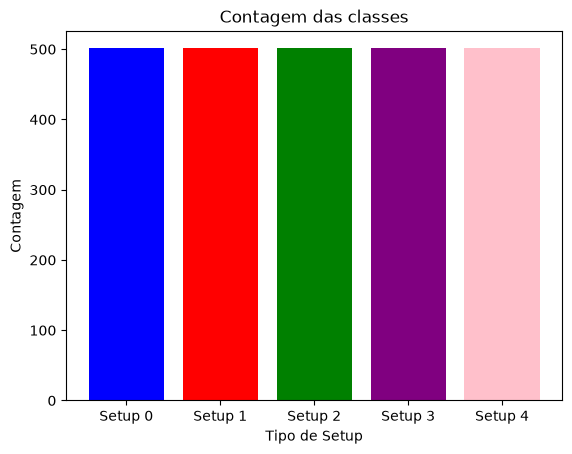

In [7]:
# Contagem das ocorrências de classes

contagem = df_maquinas["tipo_setup"].value_counts()

plt.bar(["Setup 0", "Setup 1", "Setup 2", "Setup 3", "Setup 4"], [contagem[0], contagem[1], contagem[2], contagem[3], contagem[4]], color = ["blue", "red", "green", "purple", "pink"])
plt.title("Contagem das classes")
plt.xlabel("Tipo de Setup")
plt.ylabel("Contagem")
plt.show()

Neste caso, é possível ver que o dataset já possui a quantidade de ocorrências de cada classe balanceada desde o começo, não sendo necessário realizar quaisquer operações nessa frente.

Por mais que hajam sido extraídas as informações estatísticas, é possível visualizá-las de formas alternativas se utilizando de gráficos complementares. Por exemplo, é possível elaborar um gráfico de barras que descreve a distribuição dos parâmetros utilizados:

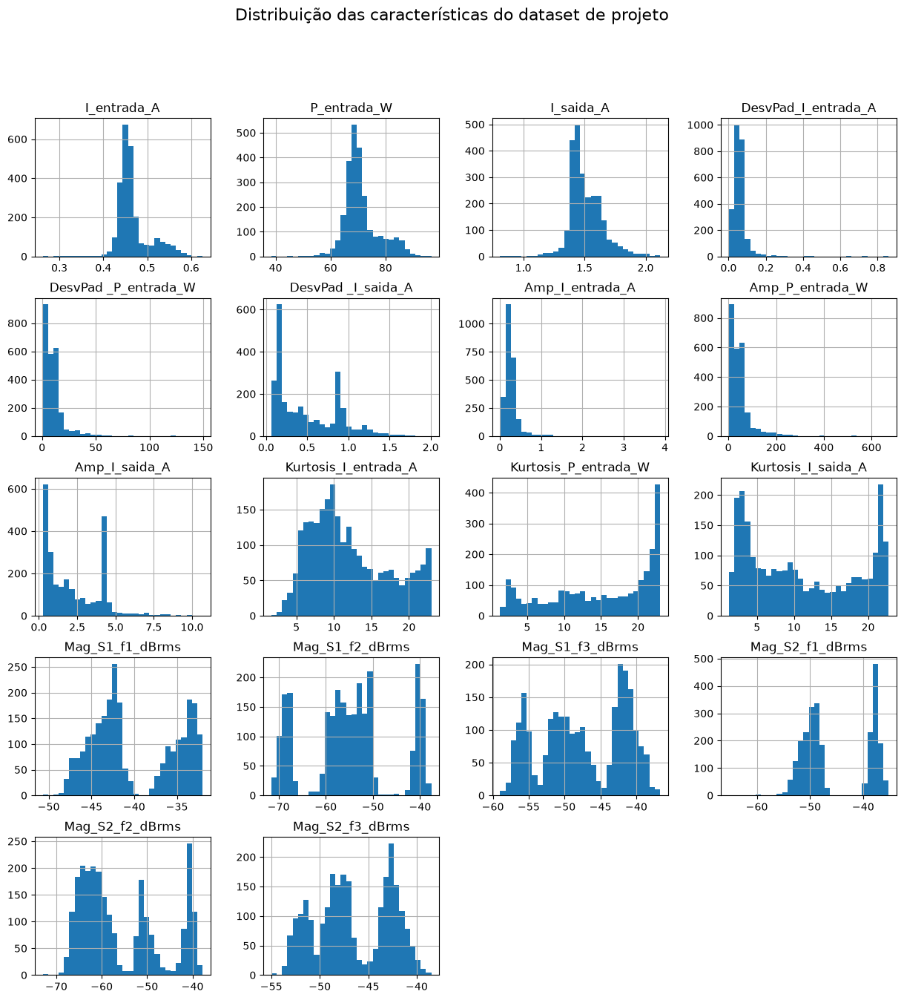

In [8]:
# Gráfico de Barra para visualizar a distribuição de atributos

df_maquinas_cut_param.hist(figsize=(15, 15), bins = 30)
plt.suptitle('Distribuição das características do dataset de projeto', fontsize=16)
plt.show()

Com esses gráficos, enquanto se observa que os valores médios de corrente de entrada, potência de entrada e corrente de saída possuem comportamentos normais, o que indica que não existe muita variação dessas informações entre as diferentes classes. Porém, gráficos com mais de um pico a exemplo dos gráficos de Kurtosis de corrente de saída e segunda harmônica do primeiro sensor de vibração também podem ser observados, esses que geram maior interesse uma vez que a existência de mais de um pico indicam que existem mais de um comportamento entre as classes que podem ser exclusivo delas, o que pode ser utilizado a nosso favor na hora de selecionar um determinado atributo para elaborar um algoritmo de classificação.

É possível também visualizar o comportamento desses comportamentos de cada parâmetro lado a lado se utilizando de um boxplot, assim como é visto na célula a seguir:

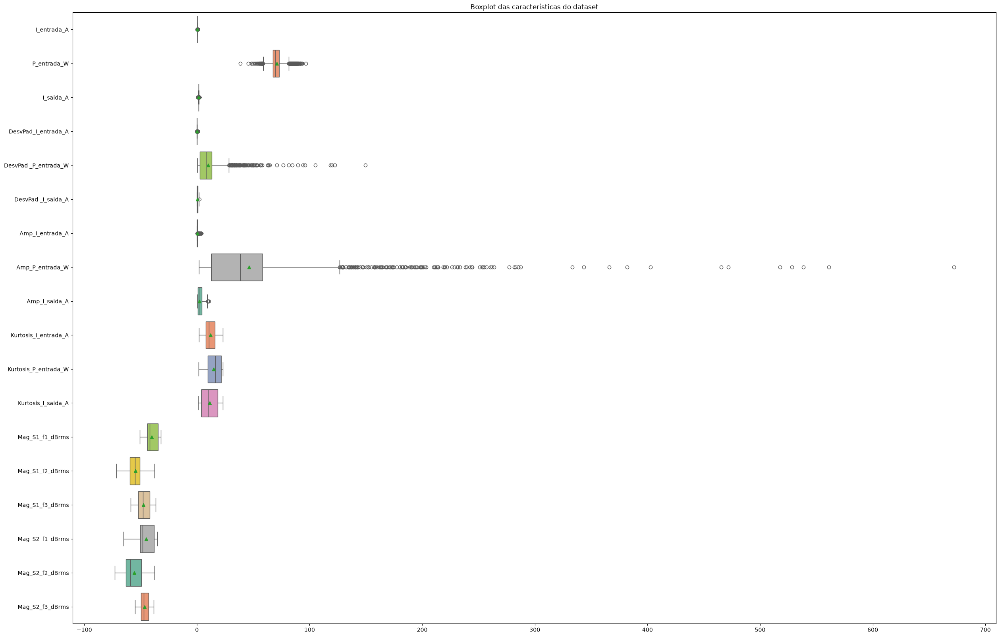

In [9]:
# Conjunto de boxplots de cada um dos parâmetros

plt.figure(figsize=(30, 20))
sns.boxplot(data=df_maquinas_cut_param, showmeans=True, orient='h', palette='Set2')
plt.title('Boxplot das características do dataset')
plt.show()

Entretanto, uma coisa a se considerar é que estamos tratando de dados de grandezas e escalas totalmente diferentes, por conta disso, as informações que podem ser extrídas por esse gráfico são quase nulas, e as futuras interpretações desses resultados, especialmente quando colocados em análise de pares, pode vir a atrapalhar e gerar conclusões precipitadas. Para resolver essa questão, podemos realizar uma normalização dos dados de forma a convertê-los para a mesma grandeza e escala, assim como é feito na célula seguinte:

In [10]:
# Normalização dos resutados

scaler = StandardScaler()
scaler.set_output(transform="pandas")
df_param_norm = scaler.fit_transform(df_maquinas_cut_param)

df_param_norm

,I_entrada_A,P_entrada_W,I_saida_A,DesvPad_I_entrada_A,DesvPad _P_entrada_W,DesvPad _I_saida_A,Amp_I_entrada_A,Amp_P_entrada_W,Amp_I_saida_A,Kurtosis_I_entrada_A,Kurtosis_P_entrada_W,Kurtosis_I_saida_A,Mag_S1_f1_dBrms,Mag_S1_f2_dBrms,Mag_S1_f3_dBrms,Mag_S2_f1_dBrms,Mag_S2_f2_dBrms,Mag_S2_f3_dBrms
0,-0.479564,-1.165433,-0.533011,-0.344360,1.066220,-1.018235,-0.391789,0.871990,-1.029896,0.081016,0.071851,-0.963731,-2.155233,-0.903983,-0.056234,-2.310823,-1.921323,-0.779624
1,-0.557625,-0.265719,1.217822,-0.236494,-0.759297,0.956124,-0.198635,-0.749875,0.915036,1.533492,-0.231209,0.804608,-2.165125,-0.920153,-0.132803,-2.304656,-1.849646,-0.751121
2,-0.408118,-0.311152,-0.801424,-0.351366,-0.433243,-0.563806,-0.272925,-0.426459,-0.470240,1.345552,-1.095494,-0.018862,-1.564403,-0.866172,-0.144942,-1.603299,-0.831801,-0.390427
3,-0.848701,-0.351537,-0.819149,0.011729,-0.593806,-0.735677,-0.194920,-0.583016,-0.709041,-0.990811,0.708719,-0.281983,-1.549911,-0.842115,-0.210607,-1.616207,-0.851889,-0.352627
4,-0.439872,-0.089011,-0.553630,-0.244282,-0.791718,-1.022265,-0.217207,-0.806866,-1.019144,1.559350,-1.819883,-1.158617,-1.421958,-0.702596,-0.252928,-1.518809,-0.577933,-0.339314
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2500,-0.037658,-0.418851,0.593816,-0.354669,-0.177604,1.078938,-0.302641,-0.172393,1.160062,-1.255178,1.057478,1.445151,1.371716,0.243786,1.011664,1.159944,0.709540,1.079489
2501,-0.532487,-1.376630,0.458525,0.111912,0.526487,1.090330,-0.183777,0.303447,1.127241,-1.302705,-0.493434,1.446679,1.338257,0.204456,0.935833,1.140557,0.698002,1.005478
2502,0.103910,0.776496,1.898983,-0.301700,2.230736,3.097450,-0.332357,2.662791,3.159885,-0.416062,0.825727,-0.706719,1.310545,0.158015,0.895778,1.119306,0.731610,0.955384
2503,0.271941,0.278395,-0.819511,-0.339267,-0.828963,-0.971492,-0.321214,-0.835717,-1.042911,1.772440,-1.819668,-1.285458,1.293674,0.125733,0.855165,1.098676,0.767871,1.078811


Feita a normalização e refazendo o boxplot anterior, é possível obter o seguinte resultado:

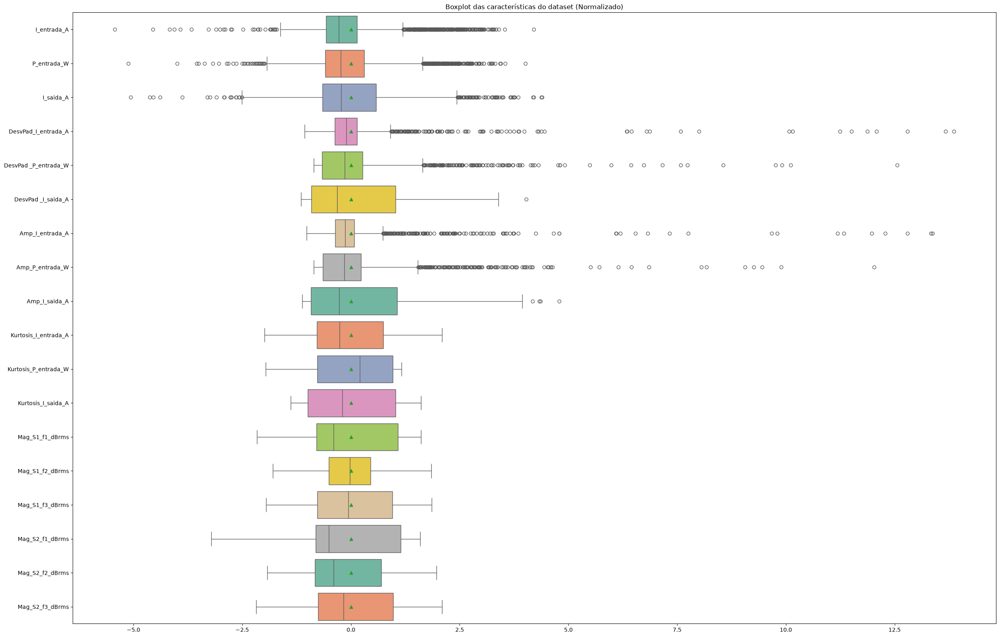

In [11]:
# Conjunto de boxplots de cada um dos parâmetros

plt.figure(figsize=(30, 20))
sns.boxplot(data=df_param_norm, showmeans=True, orient='h', palette='Set2')
plt.title('Boxplot das características do dataset (Normalizado)')
plt.show()

Como se pode ver, agora todas os parâmetros estão em mesma escala e não estão mais totalmente distorcidos como na tentativa anterior. Fica também evidente a existência de muitos outliers em diversos parâmetros, o que pode se dar visto que todas as classes estão misturadas nesse gráfico e certos tipos de comportamentos diferentes são esperados, gerando esses outliers. Entretanto, deve-se atentar também ao fato de que os parâmetros de kurtosis e os parâmetros de rúido não apresentaram quaiquer outliers, podendo ser traduzido em uma confiabilidade maior desses parâmetros.

Como a elaboração de um algoritmo de classificação baseia-se nas leituras das relações entre os atributos e a variável alvo de forma a encontrar diferencias que ajudem a separar as classes desejadas, podemos iniciar a visualizar essas relações através de uma matriz de confusão, a qual exibe o grau de correlação entre as variáveis. Esse mesmo gráfico pode ser visto a seguir:

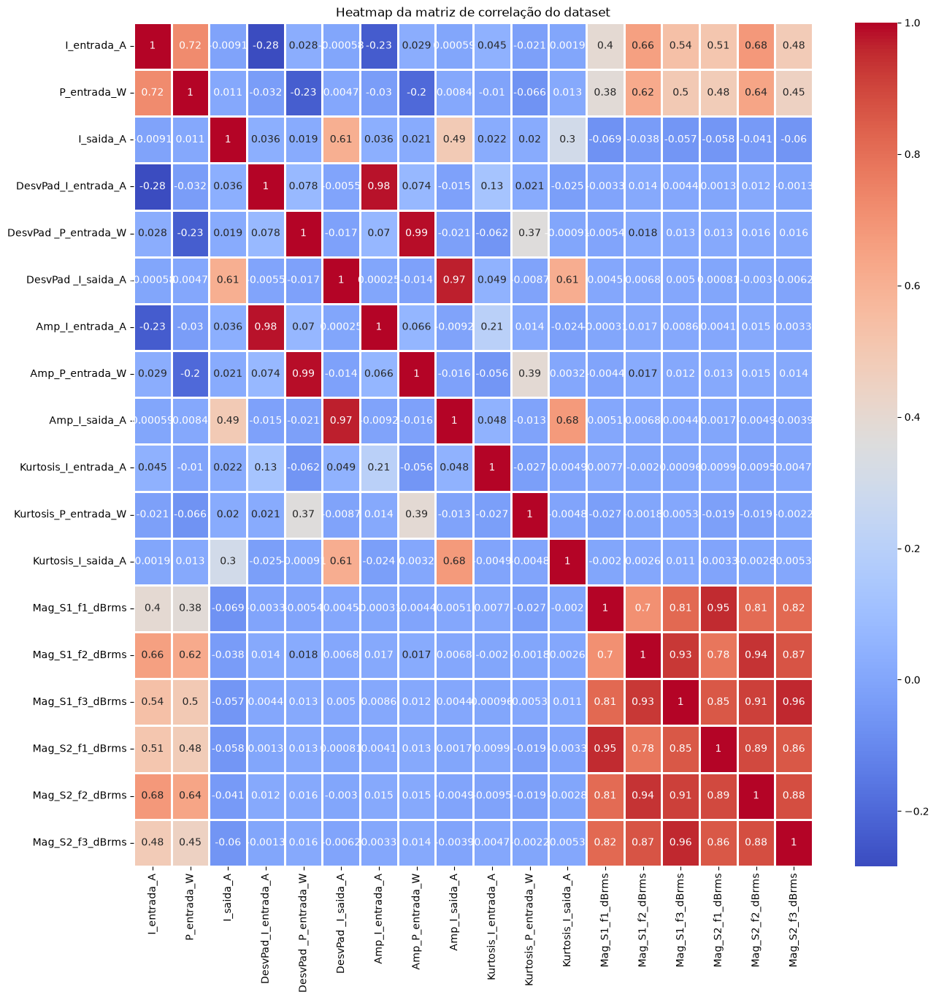

In [12]:
# Elaboração da Matriz de Confusão

correlation_matrix = df_maquinas_cut_param.corr()

plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=1)
plt.title('Heatmap da matriz de correlação do dataset')
plt.show()

Maiores graus de correlação normalmente indicam que os parâmetros em questão oferecem o mesmo tipo de informação, podendo significar redundância de atributos, o que pode ser utilizado para reaalizar a redução de dimensionalidade do problema numa etapa futura. Nesse gráfico, podemos ver:
- Alto grau de correlação entre os parâmetros de vibração de ambos os sensores;
- Médio grau de correlação entre esses mesmos parâmetros com a corrente e potência de entrada;
- Alto grau de correlação entre o desvio padrão de corrente de entrada e amplitude de corrente de entrada;
- Alto de correlação entre o desvio padrão de potência de entrada e amplitude de potência de entrada;
- Alto grau de correlação entre o desvio padrão de corrente de saída e amplitude de corrente de saída;
- Médio grau de correlação entre a kurtosis de corrente de saída com o desvio padrão e amplitude de corrente de saída;
- Médio de correlação entre corrente de entrada e potência de entrada;
- Médio de correlação entre corrente de saída com desvio padrão e amplitude de corrente de saída;

Além desse gráfico, é possível utilizar de um gráfico de pares de forma a visualizar como os resultados de cada classe estão espalhados em cada comparação de parâmetro de forma a tentar pré-visualizar separações de cada classe. Essa lógica pode ser vista no gráfico abaixo:

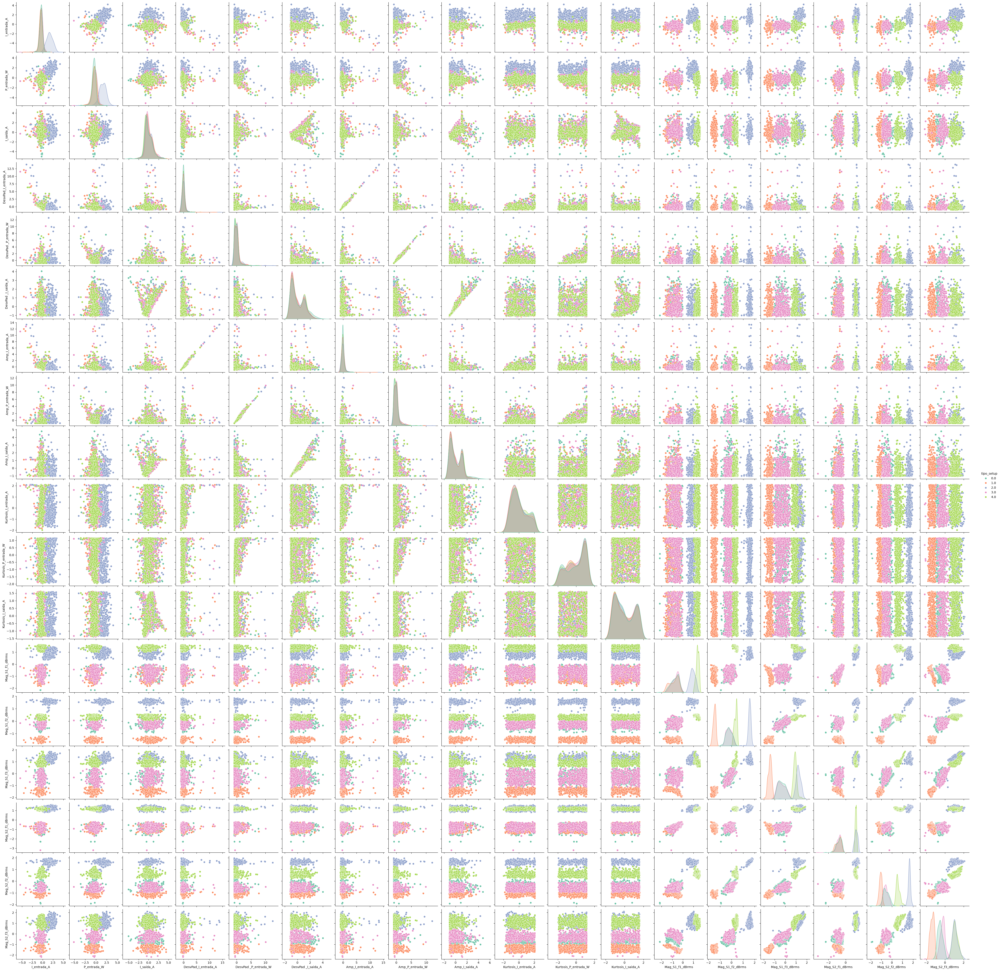

In [13]:
# Elaboração do Gráfico de Pares

new_df_maquinas = pd.concat([df_maquinas["tipo_setup"], df_param_norm], axis=1)

sns.pairplot(new_df_maquinas, hue='tipo_setup', palette='Set2')
plt.show()

Nesse caso, é possível observar que o uso dos dados de vibração tanto quando combinados entre eles quanto com outros parâmetros, é possível realizar uma certa delimitação entre as classes. Essa propriedade traz mais valor para esses atributos, especialmente quando se pensa que pode ser viável a redução da dimensionalidade do problema para facilitá-lo e evitar overfitting. Além disso, uma separação leve de classes pode ser vista na combinação das kurtosis com a corrente de entrada e potência de entrada, sendo um outro parâmetro com um certo grau de valor para a construção dos futuros modelos.

Além dos gráficos previamente exibidos, podemos também realizar boxplots de cada um dos atributos para cada uma das classes de forma a visualizar de um outro ângulo como que cada atributo "divide" as classes de interesse além de visualizar a distribuição dos atributos por cada classe desses atributos. Essa etapa pode ser vista na seguinte célula:

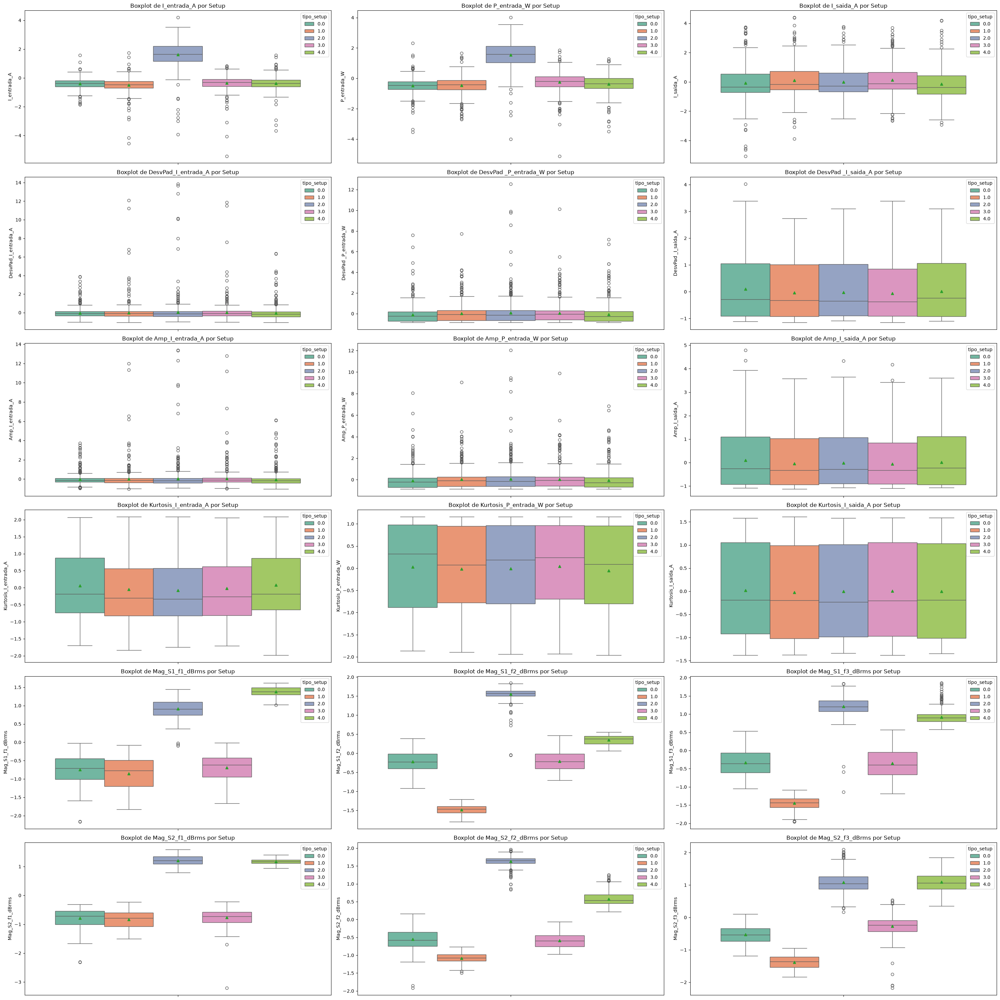

In [14]:
plt.figure(figsize=(30, 30))

for i, column in enumerate(new_df_maquinas.drop(columns=["tipo_setup"]).columns):
    plt.subplot(6, 3, i+1)
    sns.boxplot(hue="tipo_setup", y=column, data=new_df_maquinas, showmeans=True, palette='Set2')
    plt.title(f'Boxplot de {column} por Setup')
plt.tight_layout()
plt.show()

Com esses gráficos, é possível não apenas ter uma nova visão do boxplot feito anteriormente com todos os parâmetros comparados e normalizados, mas é possível analizar os comportamentos desses parâmetros dentro de cada classe. Com esse tipo de gráfico, busca-se analizar os boxplots que não se sobrepoem entre classes, visto que, quando isso acontece, significa que o parâmetro em questão é particular de um/algumas classes apenas, logo ele pode ser utilizado como um fator de classificação dos modelos a serem construídos. Nessa mesma linha, boxplots que se sobrepoem não agregam informação alguma, assim como visto, por exemplo, nos parâmetros de kurtosis. Em contraste com o gráfico anterior, as kurtosis não tem muito valor sozinhas, mas quando combinadas, por exemplo, com os parâmetros de ruído, é possível ver melhores resultados. Além disso, mais uma vez, os parâmetros de ruído novamente, especialmente a S1_f1 e S2_f1 apresentam potencial de uso por separarem os setups 2 e 4 dos demais. Os outros parâmetros de ruído também conseguem fazer o mesmo de forma muito semelhante, mas a presença de outliers mostra um sinal de alerta. Os valores de corrente de entrada e potência de entrada também possuem potencial para o setup 2, porém, como também apresentam outliers, deve-se ter cautela com tal atributo.

#### **3. Redução de Dimensionalidade**

##### **4.1. KNN Classifier**

##### **4.2. Decision Tree**

##### **4.3. SVM**

**(ver de excluir, conclusões não acertivas)**

Analisando os plots de heatmap, boxplot e scatterplot, os seguintes parâmetros estão sendo descartados:

I_Saida_A: No boxplot, não separa nenhum dos grupos. No scatterplot, não separa muito bem quase metade dos grupos e os que separa bem, há parâmetros que fazem melhor. No heatmap, há pouca correlação com outros grupos, mas tem alta correlação com seu desvio padrão e amplitude, porém tendo relação inversa com meia duzia de parâmetros.
Amp_I_Saida_A e DesvPad_I_Saida_A: Mesmos motivos descritos acima
Amp_entrada_A e DesvPad_entrada_A: Mesmo descrito acima
Amp_entrada_W e DesvPad_entrada_W: Mesmo descrito acima

Kurtosis: Tem a melhor separação com outros fatores.